# 1. Prepare

In [1]:
%load_ext autoreload

%autoreload 2

In [2]:
import math
from sklearn.metrics import classification_report
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow, imread, imsave, figure
import pandas as pd
import numpy as np
import sys
import os
from skimage.color import rgb2gray
from skimage.transform import rescale, resize
import seaborn as sns

#Keras:
import keras
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import LearningRateScheduler
from keras.optimizers import SGD
from keras.models import *
from keras.layers import *
from keras.optimizers import *
from keras.callbacks import ModelCheckpoint, LearningRateScheduler

#Custom Functions:
ROOT_DIR = os.path.abspath("../")
sys.path.append(ROOT_DIR)

from imports.utils.log_progress import log_progress
from imports.utils.visualization import Visualize, Evaluate
from imports.models.data_generator import DataGenerator
from imports.utils.enums import DATA_BASE_PATH, SHAPE
from imports.models.u_net import get_unet, get_unet_mod
from imports.models.u_net import UNet
from imports.utils.utils import rle_encode, rle_decode

DATA_IMAGE_PATH = DATA_BASE_PATH + '/Images'
DATA_MASK_PATH = DATA_BASE_PATH + '/Masks'

SHAPE = (512,768)

/opt/conda/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.
/opt/conda/lib/python3.6/site-packages/classification_models/resnext/__init__.py:4: UserWarning: Current ResNext models are deprecated, use keras.applications ResNeXt models
  warnings.warn('Current ResNext models are deprecated, '


In [3]:
import warnings
warnings.filterwarnings("ignore")

### Check if GPU available:

In [4]:
from keras import backend as K
K.tensorflow_backend._get_available_gpus()

[]

### Read Dataframes:

In [5]:
df = pd.read_pickle(DATA_BASE_PATH+"/df")
df.head(1)

,image_path,mask_path,mask_cirlce_path,name,dataset,mask_rle,mask_circle_rle,roots,splines
0,../data/00_all/images/,../data/00_all/masks/,../data/00_all/masks_autogen/,img_1000.png,None,773 253 1061 130 2308 255 2596 131 3845 254 41...,210163 81 214744 135 219334 171 223927 201 228...,"[[947.6608444830582, 198.98217169159952]]","[[[650.1494324934839, 103.97898089758343], [72..."


### Load Splited Data

In [6]:
train_df = pd.read_pickle(DATA_BASE_PATH+'/train_df')
val_df = pd.read_pickle(DATA_BASE_PATH+'/val_df')

print("Number of training Samples:", len(train_df))
print("Number of validation Samples:", len(val_df))

Number of training Samples: 405
Number of validation Samples: 102


In [7]:
train_df.sample(1)

,image_path,mask_path,mask_cirlce_path,name,dataset,mask_rle,mask_circle_rle,roots,splines
183,../data/00_all/images/,../data/00_all/masks/,../data/00_all/masks_autogen/,img_1420.png,None,435267 6 436799 14 438333 20 439868 26 441403 ...,1434994 81 1439575 135 1444165 171 1448758 201...,"[[648.0158470894874, 464.6750858457998], [748....","[[[377.0642015638575, 579.6524630609896], [412..."


# 3 Training:

### 3.1 Load UNet Model:

Vanilla UNet:

In [54]:
model = get_unet_mod(input_shape=(*SHAPE,3),feature_maps=[8,16,32,64,128,256,512],num_classes=2)

In [55]:
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_17 (InputLayer)           (None, 512, 768, 3)  0                                            
__________________________________________________________________________________________________
coordinate_channel2d_2 (Coordin (None, 512, 768, 5)  0           input_17[0][0]                   
__________________________________________________________________________________________________
conv2d_193 (Conv2D)             (None, 512, 768, 8)  368         coordinate_channel2d_2[0][0]     
__________________________________________________________________________________________________
batch_normalization_75 (BatchNo (None, 512, 768, 8)  32          conv2d_193[0][0]                 
__________________________________________________________________________________________________
activation

In [8]:
from keras.applications.resnet_v2 import ResNet50V2

In [24]:
unet = UNet()
unet.create_pretrained_model(encoder_type="vgg16",batchnorm=False,coord_conv=False)
model = unet.get_model()
unet.freeze_encoder(model)
model = unet.get_model()
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            (None, 512, 768, 3)  0                                            
__________________________________________________________________________________________________
d10 (Conv2D)                    (None, 512, 768, 64) 1792        input_3[0][0]                    
__________________________________________________________________________________________________
d11 (Conv2D)                    (None, 512, 768, 64) 36928       d10[0][0]                        
__________________________________________________________________________________________________
max_pooling2d_6 (MaxPooling2D)  (None, 256, 384, 64) 0           d11[0][0]                        
__________________________________________________________________________________________________
d20 (Conv2

In [44]:
from keras.utils import plot_model
plot_model(model, show_shapes=True,to_file='model.png')

Pretrained UNet:

In [62]:
from segmentation_models import Unet, PSPNet
from segmentation_models.losses import bce_jaccard_loss, dice_loss
from segmentation_models.metrics import iou_score
model = Unet("vgg19",input_shape=(512,768,3),encoder_weights="imagenet",freeze_encoder=True,classes=2)
#model.compile("Adam",loss=bce_jaccard_loss,metrics=[iou_score,dice_loss])

In [63]:
from keras.utils import plot_model
plot_model(model, show_shapes=True,to_file='model2.png')

In [64]:
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_18 (InputLayer)           (None, 512, 768, 3)  0                                            
__________________________________________________________________________________________________
block1_conv1 (Conv2D)           (None, 512, 768, 64) 1792        input_18[0][0]                   
__________________________________________________________________________________________________
block1_conv2 (Conv2D)           (None, 512, 768, 64) 36928       block1_conv1[0][0]               
__________________________________________________________________________________________________
block1_pool (MaxPooling2D)      (None, 256, 384, 64) 0           block1_conv2[0][0]               
__________________________________________________________________________________________________
block2_con

### 3.2 Define Train- Generator:

In [29]:
params = {'target_size': SHAPE,
          'batch_size': 4,
          'input_channels': 3,
          'shuffle': True}

# Generators
sample_gen = DataGenerator(df=train_df,hist_equal=True,augment_data=True,save_images=False,**params)
i_sample = iter(sample_gen)

Found 405 Files


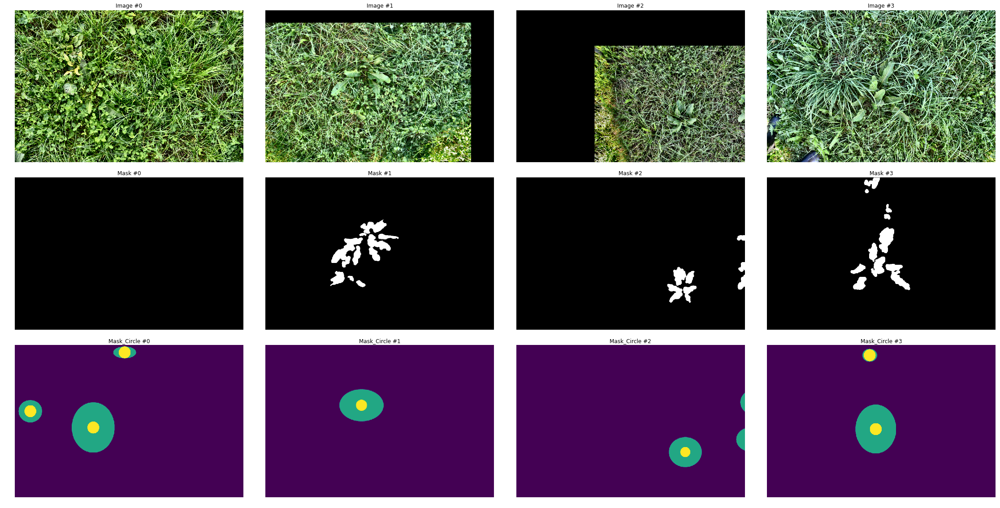

In [34]:
imgs,msks = next(i_sample)
plt.figure(figsize=(40,20))
x,y =4,1
for i in range(y):
    for j in range(x):
        plt.subplot(y*3,x,i*2*x+j+1)
        pos = i+j
        plt.imshow(imgs[pos,:,:,:].reshape(*SHAPE,3))
        plt.title('Image #{}'.format(pos))
        plt.axis('off')
        plt.subplot(y*3,x,(i*2+1)*x+j+1)
        plt.imshow(msks[pos,:,:,0].reshape(SHAPE),cmap='gray')
        plt.title('Mask #{}'.format(pos))
        plt.axis('off')
        plt.subplot(y*3,x,(i*2+2)*x+j+1)
        plt.imshow(msks[pos,:,:,1:2].reshape(*SHAPE))
        plt.title('Mask_Circle #{}'.format(pos))
        plt.axis('off')
        
plt.subplots_adjust(wspace=0.01, hspace=0.1)
plt.show()

In [11]:
print(imgs.shape)
print(msks.shape)
print(imgs.max())
print(msks.max())

(4, 512, 768, 3)
(4, 512, 768, 2)
1.0
1.0


### 3.5 Train:

In [25]:
from keras.callbacks import ModelCheckpoint, LearningRateScheduler, EarlyStopping, ReduceLROnPlateau, TensorBoard

BS = 4
import math
def step_decay(epoch):
    initial_lrate = 0.00001
    drop = 0.1
    epochs_drop = 20.0
    lrate = initial_lrate * math.pow(drop,math.floor((1+epoch)/epochs_drop))
    print("Learning Rate: " + str(lrate))
    return lrate

lrate = LearningRateScheduler(step_decay)


checkpoint = ModelCheckpoint('best_model.h5', 
                             monitor='val_loss', 
                             verbose=1, 
                             save_best_only=True, 
                             mode='min', 
                             save_weights_only = True)

reduceLROnPlat = ReduceLROnPlateau(monitor='val_dice_coeff', 
                                   factor=0.1, 
                                   patience=6, 
                                   verbose=1, 
                                   mode='max', 
                                   epsilon=0.0001, 
                                   cooldown=6, 
                                   min_lr=0.0001)

early = EarlyStopping(monitor="val_dice_coeff", 
                      mode="max", 
                      patience=18,
                      restore_best_weights=True)

tensorboard = TensorBoard(log_dir='../docs/tensorboard', 
                            histogram_freq=0, 
                            batch_size=BS, 
                            write_graph=True, 
                            write_grads=False, 
                            write_images=False, 
                            embeddings_freq=0, 
                            embeddings_layer_names=None, 
                            embeddings_metadata=None, 
                            embeddings_data=None, 
                            update_freq='epoch')

callbacks_list = [early,checkpoint,lrate]

In [26]:
params = {'target_size': (512,768),
          'batch_size': 4,
          'input_channels': 3,
          'shuffle': True}

# Generators
training_generator = DataGenerator(df=train_df,hist_equal=True,augment_data=True,save_images=False,**params)
validation_generator = DataGenerator(df=val_df,hist_equal=True,**params)

Found 405 Files
Found 102 Files


In [46]:
from keras.optimizers import RMSprop, SGD
from imports.models.losses import bce_dice_loss, dice_loss, weighted_bce_dice_loss, weighted_dice_loss, dice_coeff, iou, iou_loss
model.compile(optimizer=SGD(lr=0.001, momentum=0.95),loss=bce_jaccard_loss,metrics=[iou_score,dice_coeff])

In [ ]:
%%time
H = model.fit_generator(
    training_generator,
    steps_per_epoch=len(train_df)*1 // BS,
    validation_data=validation_generator,
    validation_steps=len(val_df) // BS,
    epochs=4,
    verbose=1,
    use_multiprocessing=False,
    workers=1,
    callbacks=callbacks_list)

In [43]:
unet.unfreeze_encoder(model)
model = unet.get_model()

In [18]:
from segmentation_models.utils import set_trainable
set_trainable(model)

In [64]:
%%time
H2 = model.fit_generator(
    training_generator,
    steps_per_epoch=len(train_df)*1 // BS,
    validation_data=validation_generator,
    validation_steps=len(val_df) // BS,
    epochs=40,
    verbose=1,
    use_multiprocessing=True,
    workers=8,
    callbacks=callbacks_list)

Epoch 1/40
Learning Rate: 1e-05
101/101 [==============================] - 102s 1s/step - loss: 0.3074 - dice_coeff: 0.7458 - iou_score: 0.5059 - val_loss: 0.3195 - val_dice_coeff: 0.7405 - val_iou_score: 0.4911

Epoch 00001: val_loss improved from inf to 0.31954, saving model to best_model.h5
Epoch 2/40
Learning Rate: 1e-05
100/101 [============================>.] - ETA: 0s - loss: 0.3088 - dice_coeff: 0.7437 - iou_score: 0.5031
Epoch 00001: val_loss improved from inf to 0.31954, saving model to best_model.h5
101/101 [==============================] - 92s 913ms/step - loss: 0.3082 - dice_coeff: 0.7442 - iou_score: 0.5039 - val_loss: 0.3146 - val_dice_coeff: 0.7465 - val_iou_score: 0.4984

Epoch 00002: val_loss improved from 0.31954 to 0.31462, saving model to best_model.h5
Epoch 3/40
Learning Rate: 1e-05
101/101 [==============================] - 93s 917ms/step - loss: 0.3003 - dice_coeff: 0.7526 - iou_score: 0.5102 - val_loss: 0.3241 - val_dice_coeff: 0.7405 - val_iou_score: 0.4963




Epoch 00024: val_loss improved from 0.28993 to 0.28668, saving model to best_model.h5
Epoch 25/40
Learning Rate: 1.0000000000000002e-06
101/101 [==============================] - 84s 834ms/step - loss: 0.2510 - dice_coeff: 0.7937 - iou_score: 0.5706 - val_loss: 0.2912 - val_dice_coeff: 0.7688 - val_iou_score: 0.5324

Epoch 00025: val_loss did not improve from 0.28668
Epoch 26/40
Learning Rate: 1.0000000000000002e-06
101/101 [==============================] - 85s 841ms/step - loss: 0.2501 - dice_coeff: 0.7947 - iou_score: 0.5710 - val_loss: 0.2974 - val_dice_coeff: 0.7622 - val_iou_score: 0.5349

Epoch 00026: val_loss did not improve from 0.28668
Epoch 27/40
Learning Rate: 1.0000000000000002e-06
100/101 [============================>.] - ETA: 0s - loss: 0.2546 - dice_coeff: 0.7907 - iou_score: 0.5668
Epoch 00026: val_loss did not improve from 0.28668
101/101 [==============================] - 86s 853ms/step - loss: 0.2538 - dice_coeff: 0.7914 - iou_score: 0.5678 - val_loss: 0.2919 - va

In [65]:
vis_params = {'df':val_df,
              'input_shape':(512,768,3),
              'pred_layer':2,
              'model':model}

visualize = Visualize(**vis_params)

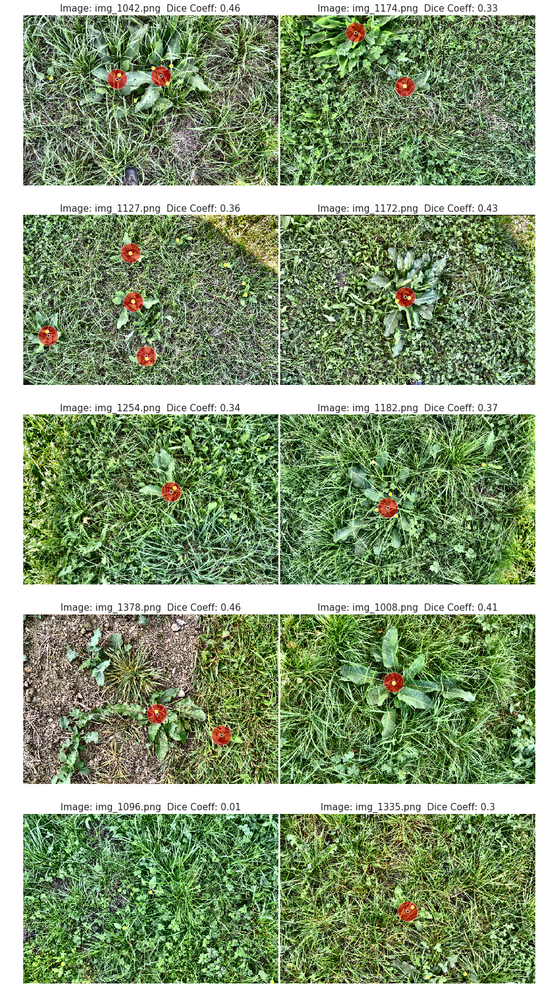

In [74]:
visualize.show_matrix(index='random',mode='image_prediction_roots',rows=5)

In [19]:
#H2 = H

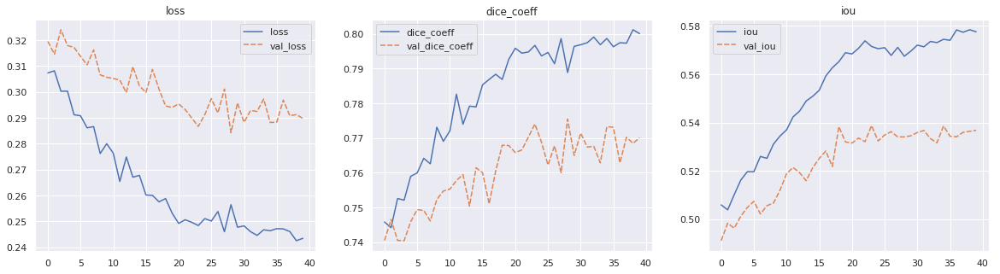

In [67]:
plt.figure(figsize=(20,5))

plt.subplot(1,3,1)
data = {#"epochs":np.linspace(0,len(H.history['dice_coeff']),len(H.history['dice_coeff'])),
        "loss":H2.history['loss'],
        "val_loss":H2.history['val_loss']}
loss_data = pd.DataFrame.from_dict(data)
sns.set(style="darkgrid")
ax = sns.lineplot(data=loss_data).set_title("loss")

plt.subplot(1,3,2)
data = {#"epochs":np.linspace(0,len(H.history['dice_coeff']),len(H.history['dice_coeff'])),
        "dice_coeff":H2.history['dice_coeff'],
        "val_dice_coeff":H2.history['val_dice_coeff']}
dice_data = pd.DataFrame.from_dict(data)
sns.set(style="darkgrid")
ax = sns.lineplot(data=dice_data).set_title("dice_coeff")

plt.subplot(1,3,3)
data = {#"epochs":np.linspace(0,len(H.history['dice_coeff']),len(H.history['dice_coeff'])),
        "iou":H2.history['iou_score'],
        "val_iou":H2.history['val_iou_score']}
iou_data = pd.DataFrame.from_dict(data)
sns.set(style="darkgrid")
ax = sns.lineplot(data=iou_data).set_title("iou")

In [52]:
model.save('unet_smaller_vgg16_dice_0.7353_iou_0.4969.h5')

In [53]:
loss_data.to_pickle("loss_data_df_unet_smaller_vgg16_dice_0.7353_iou_0.4969")
dice_data.to_pickle("dice_data_df_unet_smaller_vgg16_dice_0.7353_iou_0.4969")
iou_data.to_pickle("iou_data_df_unet_smaller_vgg16_dice_0.7353_iou_0.4969")

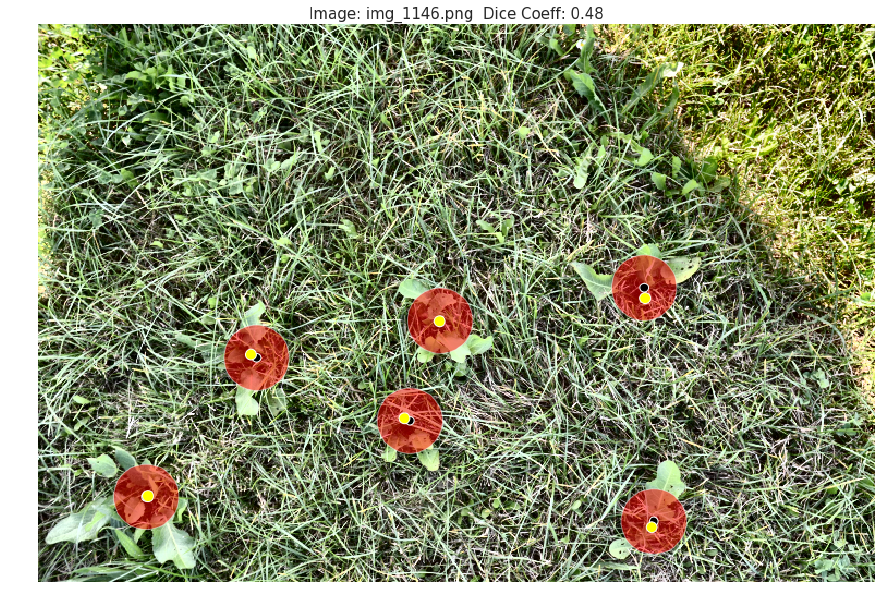

In [98]:
vis_params = {'df':val_df,
              'input_shape':(512,768,3),
              'pred_layer':2,
              'model':model}

root_pred = Visualize(**vis_params)
#img_1114
root_pred.show_single("1146",mode="image_prediction_roots")

In [100]:
ev_params = {'df':val_df,
             'input_shape':(512,768,3),
             'pred_layer' : 1,
             'model':model}
ev = Evaluate(**ev_params)

unet_mask_dice_min, unet_mask_dice_max, unet_mask_dice_avg = ev.get_dice_coeff_score(mode='simple')

print("Average Dice Coefficient: %f" % unet_mask_dice_avg)
print("Min Dice Coefficient: %f" % unet_mask_dice_min)
print("Max Dice Coefficient: %f" % unet_mask_dice_max)

Average prediction time: 0.09 s
Average Dice Coefficient: 0.803778
Min Dice Coefficient: 0.003602
Max Dice Coefficient: 0.958895


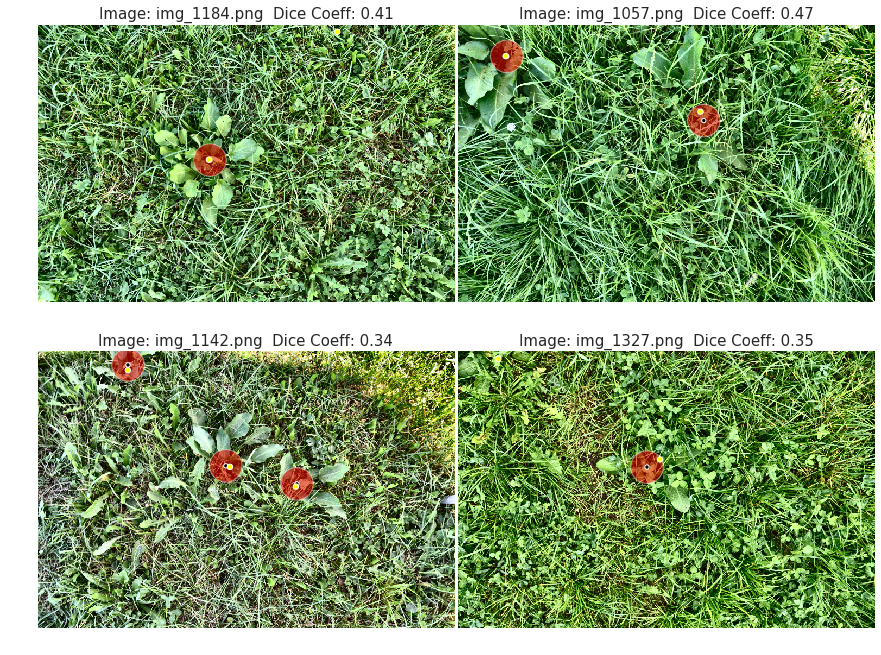

In [99]:
root_pred.show_matrix('random',mode="image_prediction_roots",rows=2)

In [97]:
ev.get_root_precicion_v2("1318",tolerance=tolerance)

(0, 0, 1, 0.0, 0.0)

In [88]:
tolerance = 30
ev_params = {'df':val_df,
             'input_shape':(512,768,3),
             'pred_layer' : 2,
             'model':model}
ev = Evaluate(**ev_params)

tPs = []
fPs = []
fNs = []
precicions = []
recalls = []
val_log = []
for roots_per_image in range(1,7):
    print("Max roots_per_image: " + str(roots_per_image))
    print("TP\tFP\tFN\tPrecicion\tRecall\tImageName")
    for i,row in val_df.iterrows():
        if len(row["roots"]) <= roots_per_image:
            #print(len(row["roots"]))
            tP, fP, fN, precicion, recall = ev.get_root_precicion_v2(row["name"],tolerance=tolerance)
            print("{}\t{}\t{}\t{:1.2f}\t{:1.2f}\t{}".format(tP, fP, fN, precicion, recall, row['name']))
            tPs.append(tP)
            fPs.append(fP)
            fNs.append(fN)
            precicions.append(precicion)
            recalls.append(recall)
    val_log.append((tPs,fPs,fNs,precicions,recalls))
    tPs = []
    fPs = []
    fNs = []
    precicions = []
    recalls = []

Max roots_per_image: 1
TP	FP	FN	Precicion	Recall	ImageName
1	0	0	1.00	1.00	img_1232.png
1	1	0	0.50	1.00	img_1023.png
1	0	0	1.00	1.00	img_1484.png
1	0	0	1.00	1.00	img_1077.png
1	0	0	1.00	1.00	img_1273.png
1	1	0	0.50	1.00	img_1295.png
0	0	0	0.00	0.00	img_1318.png
1	0	0	1.00	1.00	img_1274.png
1	0	0	1.00	1.00	img_1260.png
1	0	0	1.00	1.00	img_1088.png
1	0	0	1.00	1.00	img_1364.png
1	0	0	1.00	1.00	img_1320.png
1	1	0	0.50	1.00	img_1100.png
1	0	0	1.00	1.00	img_1434.png
1	0	0	1.00	1.00	img_1299.png
1	0	0	1.00	1.00	img_1002.png
1	1	0	0.50	1.00	img_1174.png
1	0	0	1.00	1.00	img_1275.png
1	0	0	1.00	1.00	img_1089.png
1	0	0	1.00	1.00	img_1183.png
1	0	0	1.00	1.00	img_1107.png
1	0	0	1.00	1.00	img_1053.png
1	0	0	1.00	1.00	img_1136.png
1	0	0	1.00	1.00	img_1047.png
1	1	0	0.50	1.00	img_1411.png
1	0	0	1.00	1.00	img_1110.png
1	0	0	1.00	1.00	img_1466.png
1	0	0	1.00	1.00	img_1004.png
1	2	0	0.33	1.00	img_1384.png
1	0	0	1.00	1.00	img_1393.png
1	0	0	1.00	1.00	img_1086.png
1	0	0	1.00	1.00	img_1454.png
1	0	0	1.00	1.

1	0	1	1.00	0.50	img_1327.png
3	0	0	1.00	1.00	img_1243.png
1	0	2	1.00	0.33	img_1335.png
2	0	0	1.00	1.00	img_1340.png
1	0	0	1.00	1.00	img_1213.png
1	0	0	1.00	1.00	img_1424.png
1	1	3	0.50	0.25	img_1167.png
1	0	1	1.00	0.50	img_1173.png
1	1	0	0.50	1.00	img_1125.png
1	0	0	1.00	1.00	img_1246.png
1	0	1	1.00	0.50	img_1229.png
Max roots_per_image: 5
TP	FP	FN	Precicion	Recall	ImageName
1	0	0	1.00	1.00	img_1232.png
1	1	0	0.50	1.00	img_1023.png
1	0	0	1.00	1.00	img_1484.png
0	1	4	0.00	0.00	img_1182.png
2	0	2	1.00	0.50	img_1270.png
0	0	0	0.00	0.00	img_1083.png
2	1	0	0.67	1.00	img_1446.png
1	0	0	1.00	1.00	img_1172.png
0	1	2	0.00	0.00	img_1014.png
1	0	0	1.00	1.00	img_1077.png
1	0	1	1.00	0.50	img_1339.png
0	0	0	0.00	0.00	img_1096.png
1	0	1	1.00	0.50	img_1091.png
1	0	0	1.00	1.00	img_1273.png
2	0	0	1.00	1.00	img_1448.png
3	0	0	1.00	1.00	img_1398.png
1	0	2	1.00	0.33	img_1450.png
1	1	0	0.50	1.00	img_1295.png
2	0	3	1.00	0.40	img_1476.png
1	0	1	1.00	0.50	img_1238.png
0	0	0	0.00	0.00	img_1318.png
1	0	0	1.00	1.

### 3.7 Visualize Error Mask

In [76]:
ev_params = {'df':val_df,
             'input_shape':(512,768,3),
             'pred_layer' : 1,
             'model':model}
ev = Evaluate(**ev_params)

Aufsummiern aller falsch detektieren Masken (False Positive + False Negative):

In [77]:
def predict_all_error(df):
    error_sum = np.zeros(SHAPE)
    for i, row in df.iterrows():
        err = ev.get_full_error_mask(index=row['name'])
        error_sum += err
    return error_sum

In [79]:
summed_mask_error = predict_all_error(val_df)

Visualisierung aller überlagerten False Positiv + False Negativ Masken:

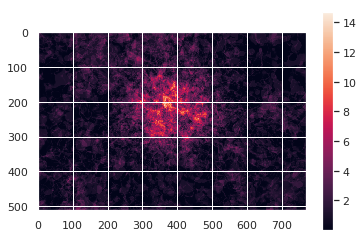

In [81]:
imshow(summed_mask_error)
plt.colorbar()

In [83]:
summed_mask_train = np.zeros((1024,1536))
for i,row in val_df.iterrows():
    summed_mask_train += rle_decode(row['mask_rle'],(1024,1536))
summed_mask_train = resize(summed_mask_train,(512,768))

Vergleich der summierten Trainingsmasken (Bild rechts) mit den summierten Falschen vorhersagen (Bild mitte). Das Bild rechts zeigt die subtraktion der normalisierten Trainingsmasken mit den normalisierten False Positiv + False Negativ:

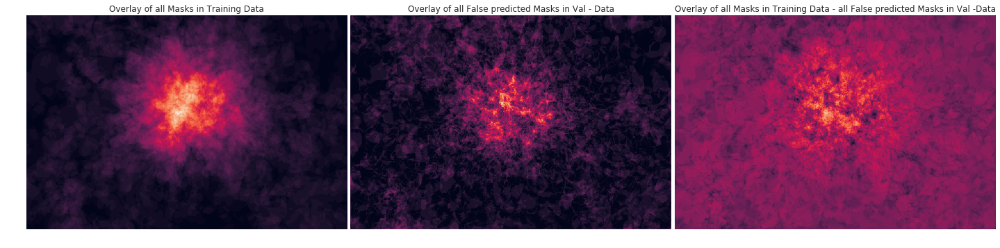

In [84]:
fig, axs = plt.subplots(ncols=3,nrows=1,figsize=(25,18))
axs[0].imshow(summed_mask_train)
axs[1].imshow(summed_mask_error)
#axs[1,0].imshow(summed_mask_train-summed_mask_error)
axs[2].imshow(summed_mask_train/summed_mask_train.max()-summed_mask_error/summed_mask_error.max())
axs[0].set_title('Overlay of all Masks in Training Data')
axs[0].axis('off')
axs[1].set_title('Overlay of all False predicted Masks in Val - Data')
axs[1].axis('off')
axs[2].set_title('Overlay of all Masks in Training Data - all False predicted Masks in Val -Data')
axs[2].axis('off')
plt.subplots_adjust(wspace=0.01, hspace=0)

Die meisten falsch vohergesagten Masken befinden sich zwar im Zentrum der Bilder (wie die meisten Masken in den Trainingsbildern), jedoch sind diese besser Verteilt als die Ground Truth Masken. (Die Farbskalierung der Bilder ist bei beiden gleich) 
Daraus schliesse ich, das sich die Anhäufung der GroundTruth- Masken in den Trainingsdaten im Zentrum, negativ auf die vorhersagen von Blacken im Randbereich asuwirkt. d.h. es werden im Randbereich der Bilder überdurchschnittlich viele Blacken falsch vorhergesagt.

<img src="../docs/notebook_images/False_negativ_positv.png">